In [1]:
from simpleicp import PointCloud, SimpleICP
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
from sklearn.neighbors import NearestNeighbors

In [2]:
def best_fit_transform(A, B):
    '''
    Calculates the least-squares best-fit transform that maps corresponding points A to B in m spatial dimensions
    Input:
      A: Nxm numpy array of corresponding points
      B: Nxm numpy array of corresponding points
    Returns:
      T: (m+1)x(m+1) homogeneous transformation matrix that maps A on to B
      R: mxm rotation matrix
      t: mx1 translation vector
    '''

    # get number of dimensions
    m = A.shape[1]

    # translate points to their centroids
    centroid_A = np.mean(A, axis=0)
    centroid_B = np.mean(B, axis=0)
    AA = A - centroid_A
    BB = B - centroid_B

    # rotation matrix
    H = np.dot(AA.T, BB)
    U, S, Vt = np.linalg.svd(H)
    R = np.dot(Vt.T, U.T)

    # special reflection case
    if np.linalg.det(R) < 0:
        Vt[m-1,:] *= -1
        R = np.dot(Vt.T, U.T)

    # translation
    t = centroid_B.T - np.dot(R,centroid_A.T)

    # homogeneous transformation
    T = np.identity(m+1)
    T[:m, :m] = R
    T[:m, m] = t

    return T, R, t

In [3]:
def nearest_neighbor(src, dst):
    '''
    Find the nearest (Euclidean) neighbor in dst for each point in src
    Input:
        src: Nxm array of points
        dst: Nxm array of points
    Output:
        distances: Euclidean distances of the nearest neighbor
        indices: dst indices of the nearest neighbor
    '''

    neigh = NearestNeighbors(n_neighbors=1)
    neigh.fit(dst)
    distances, indices = neigh.kneighbors(src, return_distance=True)
    return distances.ravel(), indices.ravel()

In [94]:
def icp(A, B, init_pose=None, max_iterations=20, tolerance=0.001):
    '''
    The Iterative Closest Point method: finds best-fit transform that maps points A on to points B
    Input:
        A: Nxm numpy array of source mD points
        B: Nxm numpy array of destination mD point
        init_pose: (m+1)x(m+1) homogeneous transformation
        max_iterations: exit algorithm after max_iterations
        tolerance: convergence criteria
    Output:
        T: final homogeneous transformation that maps A on to B
        distances: Euclidean distances (errors) of the nearest neighbor
        i: number of iterations to converge
    '''
    transformations = []
    assert A.shape == B.shape

    # get number of dimensions
    m = A.shape[1]

    # make points homogeneous, copy them to maintain the originals
    src = np.ones((m+1,A.shape[0]))
    dst = np.ones((m+1,B.shape[0]))
    src[:m,:] = np.copy(A.T)
    dst[:m,:] = np.copy(B.T)

    # apply the initial pose estimation
    if init_pose is not None:
        src = np.dot(init_pose, src)

    prev_error = 0

    for i in range(max_iterations):
        # find the nearest neighbors between the current source and destination points
        distances, indices = nearest_neighbor(src[:m,:].T, dst[:m,:].T)

        # compute the transformation between the current source and nearest destination points
        T,_,_ = best_fit_transform(src[:m,:].T, dst[:m,indices].T)

        # update the current source
        src = np.dot(T, src)

        # check error
        mean_error = np.mean(distances)
        if np.abs(prev_error - mean_error) < tolerance:
            break
        prev_error = mean_error
        
        # to animate the results. First homogenize the source matrix in order to be compatible
        # with the transformation matrix
    
        zero_array = np.zeros((A.shape[0]+1,A.shape[1]+1))
        zero_array[:A.shape[0],:A.shape[1]] = A
        zero_array[-1,-1]=1

        # Mutliply the source matrix with the transformation matrix
        transformed_matrix = np.matmul(zero_array,T)
        transformations.append(transformed_matrix[:A.shape[0],:A.shape[1]])

    # calculate final transformation
    T,_,_ = best_fit_transform(A, src[:m,:].T)
    return T, distances, i,transformations

In [95]:
X_fix = np.genfromtxt("./org2.pts")
X_mov = np.genfromtxt("./rotated2.pts")

In [96]:
T,dist,i,transformations = icp(X_mov,X_fix,max_iterations=100)

In [98]:
def plot_data(data_1, data_2, label_1, label_2,name):
    fig = plt.figure(figsize=(10, 6))
    ax = fig.add_subplot(projection='3d')
    if data_1 is not None:
        x_p, y_p,z_p = data_1[:,0],data_1[:,1],data_1[:,2]
        ax.scatter3D(x_p, y_p,z_p, color='red', label=label_1)
    if data_2 is not None:
        x_q, y_q,z_q = data_2[:,0],data_2[:,1],data_2[:,2]
        ax.scatter3D(x_q, y_q,z_q, color='blue', label=label_2)
    ax.legend()
    ax.view_init(elev=10., azim=0,vertical_axis='y')
    ax.axis('off')
    plt.savefig(f'./images/fig_{name}.jpg',bbox_inches='tight')
    return ax

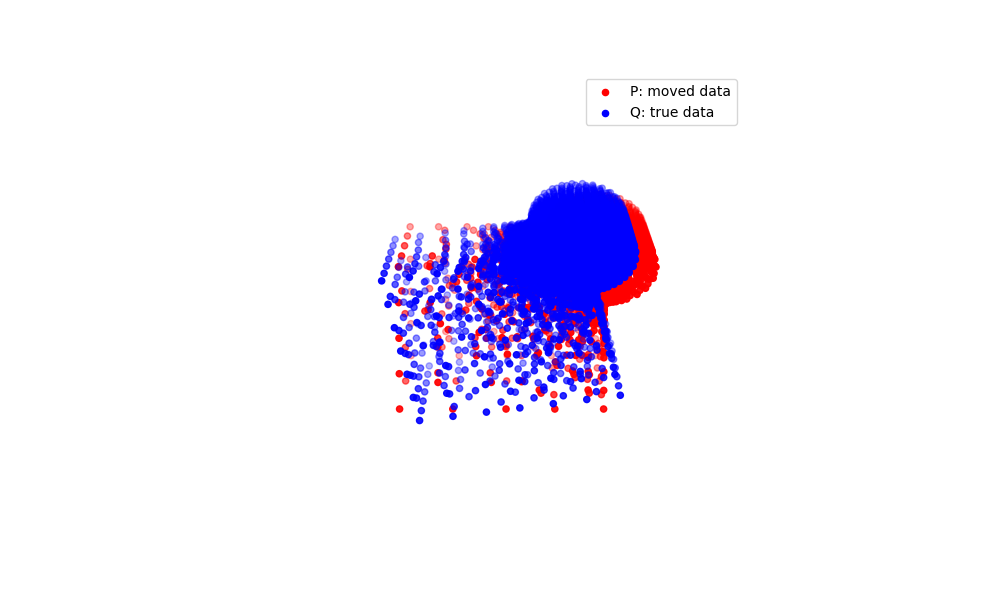

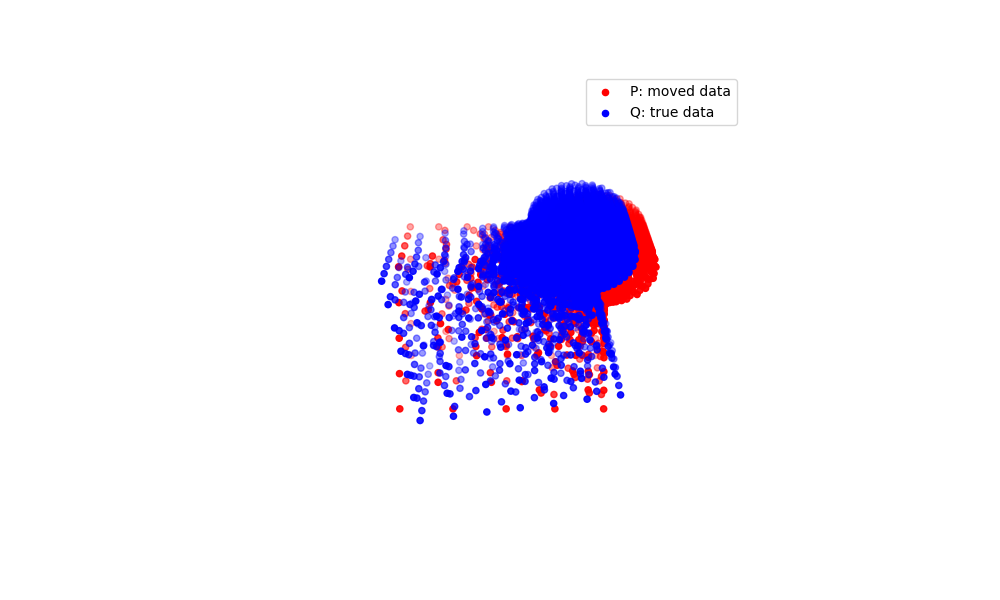

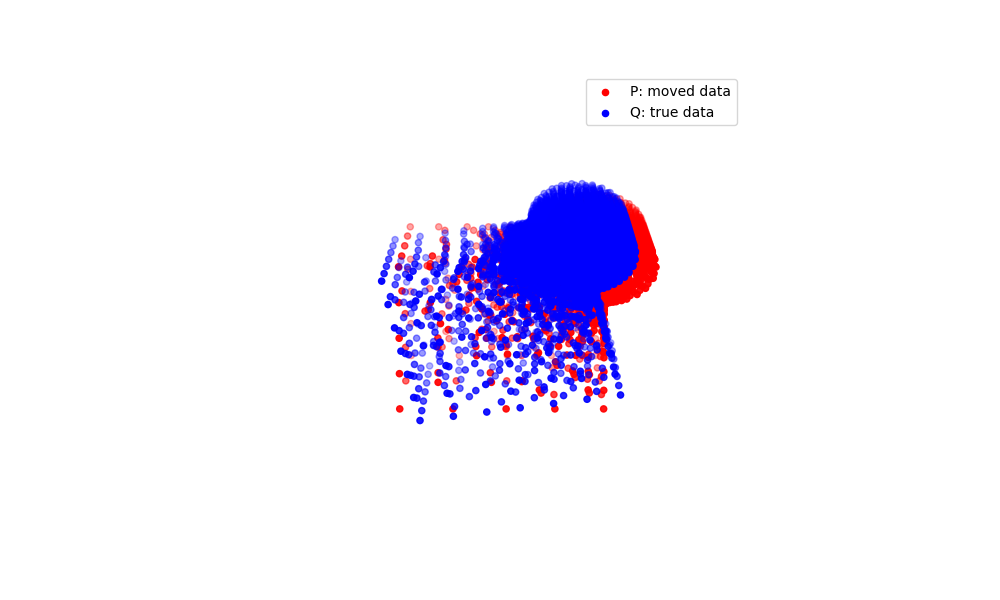

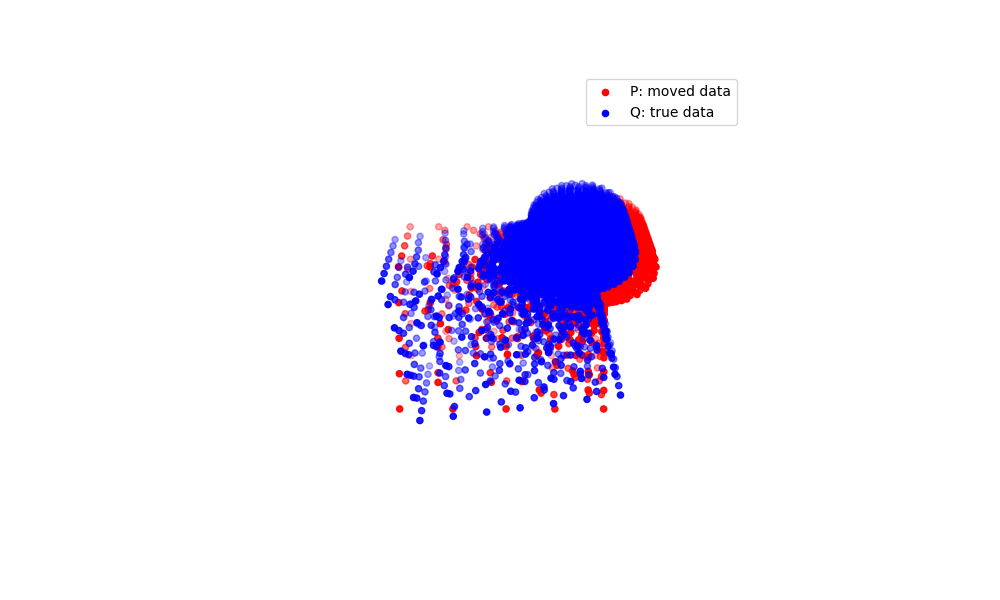

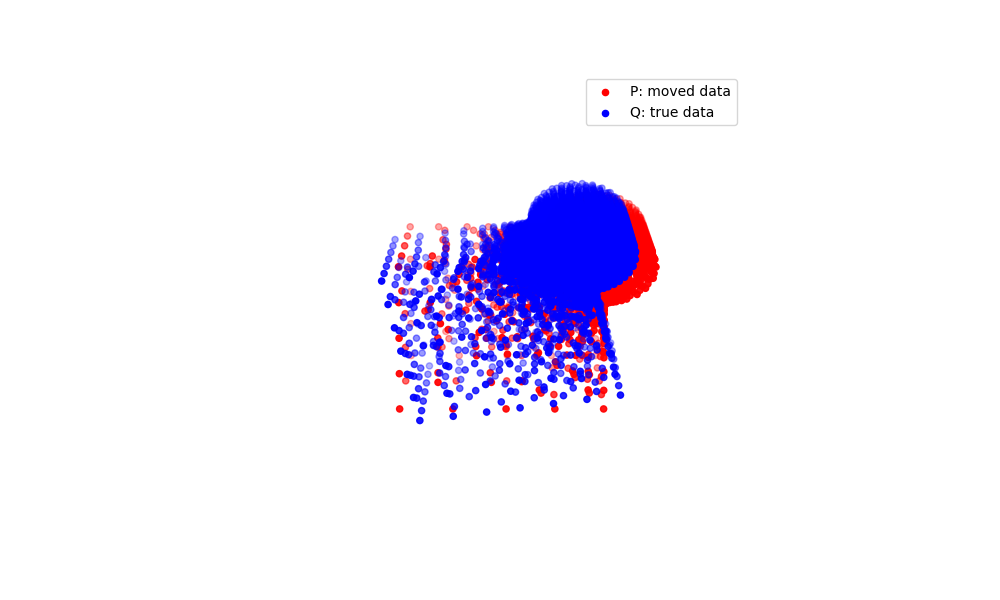

...

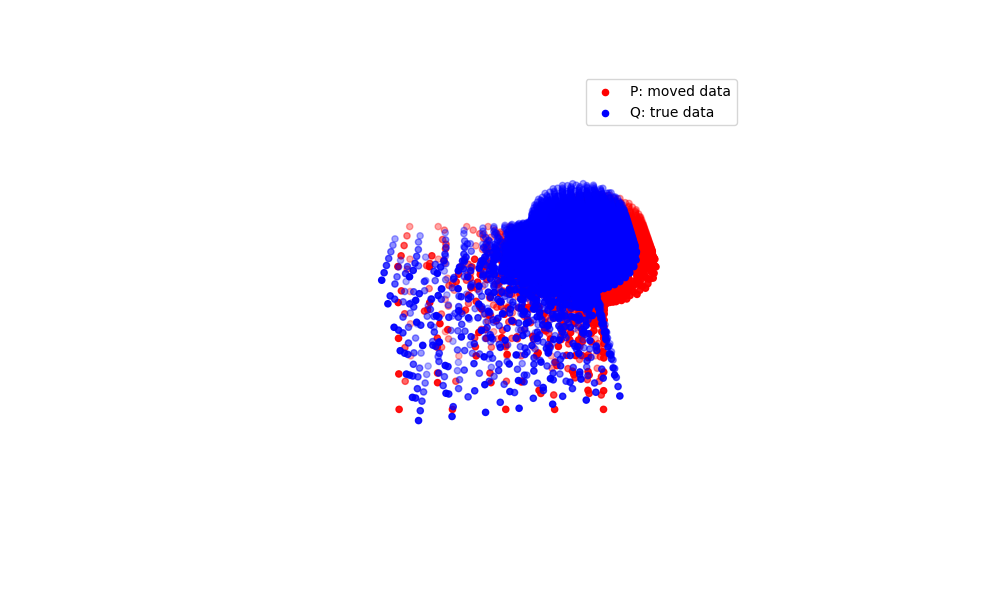

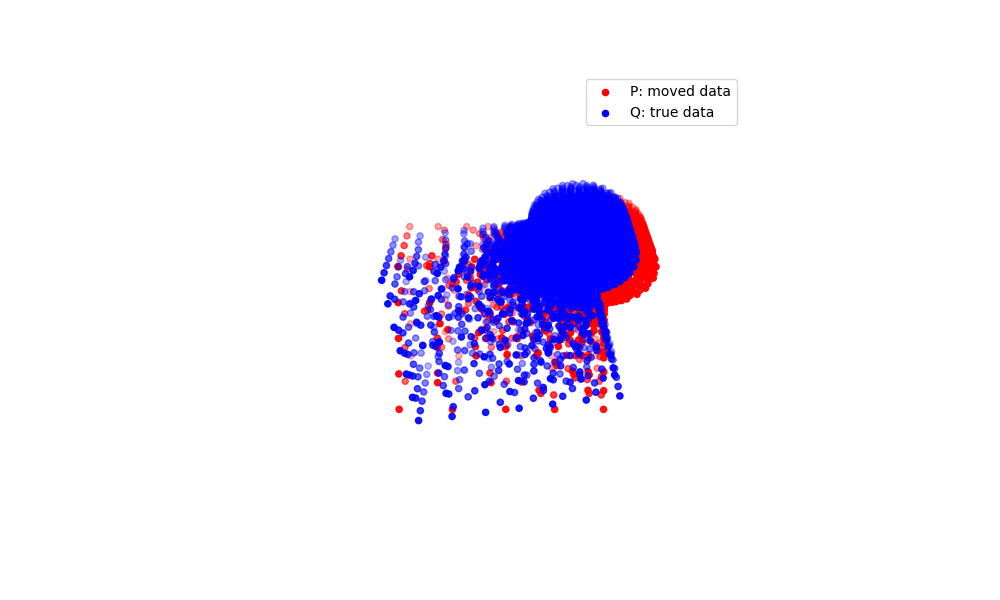

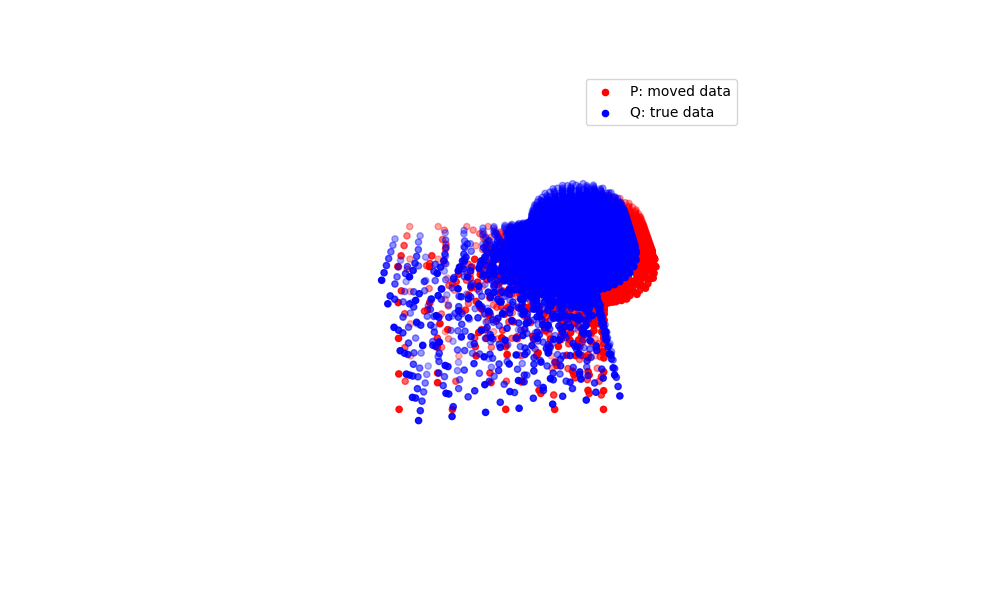

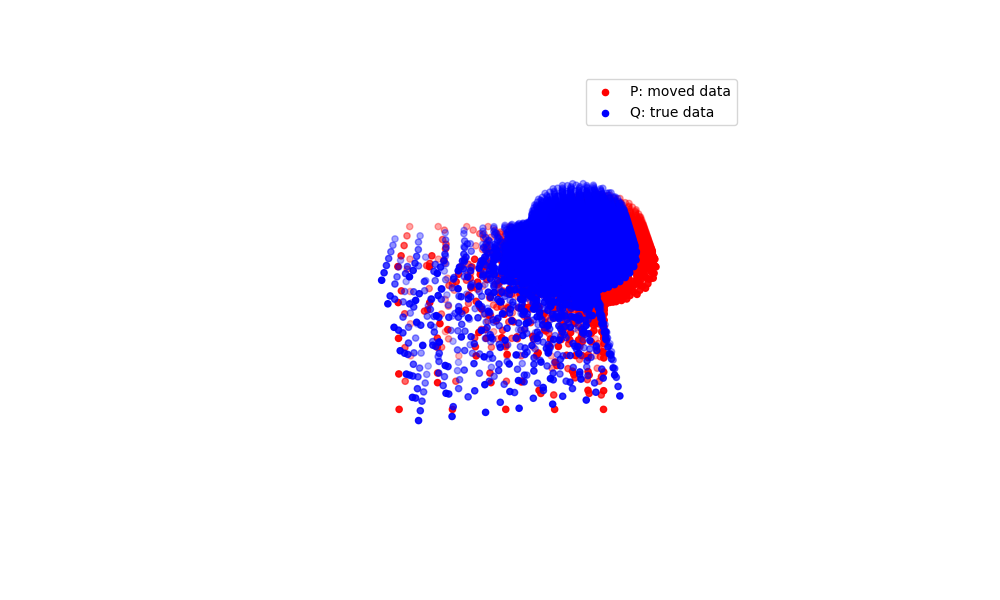

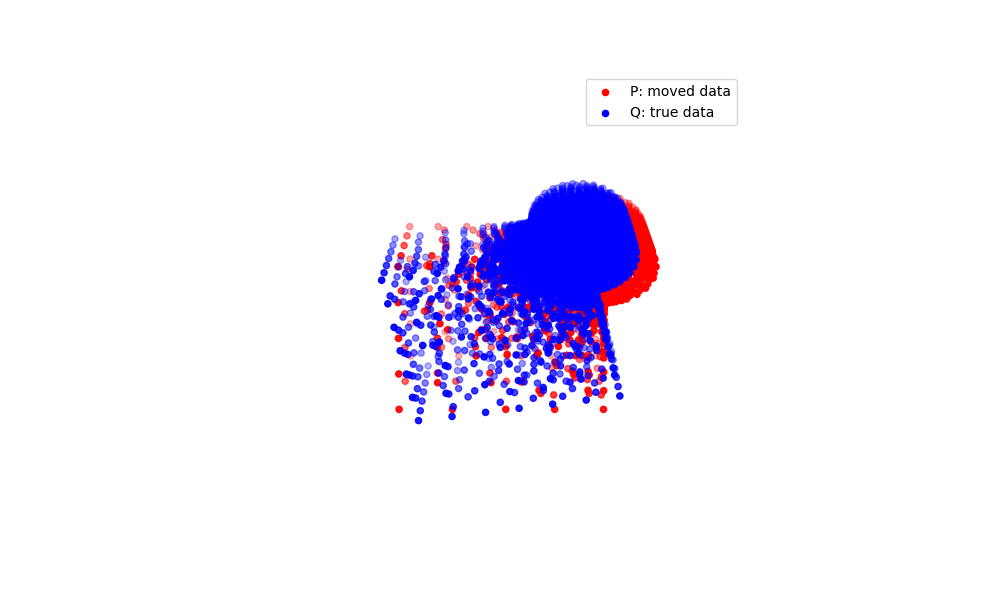

In [99]:
for i,data in enumerate(transformations):
    plot_data(X_fix,data,"P: moved data", "Q: true data",i)